In [200]:
from bs4 import BeautifulSoup
import numpy as np
import pandas as pd
import seaborn as sns

In [201]:
with open("magicbricksdataset.html" , "r" ,encoding="utf-8") as f:
    html=f.read()

'<html lang="en"><head>\n<meta charset="UTF-8">\n<meta http-equiv="X-UA-Compatible" content="IE=edge,chrome=1">\n<meta name="viewport" content="width=device-width, initial-scale=1">\n<title>\nFlats for Sale in Pune: Check 47687+ Apartments / Flats in Pune\n</title>\n<link href="https://fonts.gstatic.com" rel="dns-prefetch">\n<link rel="preconnect" href="https://cdn.staticmb.com">\n<link rel="preconnect" href="https://img.staticmb.com">\n<link href="https://www.googletagmanager.com" rel="dns-prefetch">\n<link href="https://www.google-analytics.com" rel="dns-prefetch">\n<link rel="shortcut icon" href="https://cdn.staticmb.com/images/favicon.ico">\n<meta name="description" content="Find over 47687+ Flats in Pune for sale only at MagicBricks. Choose from Owner Properties &amp;  Verified Flats Listings with option of 2 BHK, 3 BHK, 4 BHK apartments in Pune. ">\n<link rel="preload" as="image" href="https://img.staticmb.com/mbimages/project/Photo_h310_w462/2023/07/20/Project-Photo-22-24K-Altur
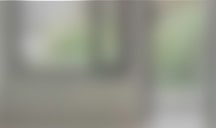
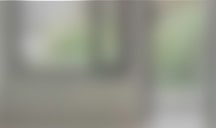

In [202]:
html

In [203]:
soup=BeautifulSoup(html,"lxml")

In [204]:
contuners=(soup.find_all("div",{"class":"mb-srp__list"}))

In [205]:
location = []
carpet_area = []
status =[]
transaction=[]
urnishing=[]
society=[]
bathroom=[]
amount=[]


for i in contuners:
    location.append(i.find("h2").text)
   #(i.find("div", {"class":"mb-srp__card__summary--label"}).text)
    carpet_area.append(i.find("div",{"class":"mb-srp__card__summary--value"}).text)
    try:
      status.append(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'status'}).text)
    except:
      status.append(np.nan)
    try:
      transaction.append(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'transaction'}).text)
    except:
      transaction.append(np.nan)
    try:
      urnishing.append(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'furnishing'}).text)
    except:
     urnishing.append(np.nan)
    try:
      society.append(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'society'}).text)
    except:
      society.append(np.nan)
    try:
      bathroom.append(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'bathroom'}).text)
    except:
      bathroom.append(np.nan)
    #print(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'furnishing'}).text)
    #print(i.find('div', {'class': 'mb-srp__card__summary__list--item', 'data-summary': 'furnishing'}).text)
    #print(i.find('div',{"class":'mb-srp__card__summary__list--item' , 'data-summary': 'super-area'}).text)
    try:
      amount.append(i.find('div',{"class":"mb-srp__card__price--amount"}).text)
    except:
      amount.append(np.nan)


In [206]:
df=pd.DataFrame({
    "location":location,
    "carpet_area":carpet_area,
    "status":status,  
    "transaction":transaction,
    "urnishing":urnishing,
    "society":society,
    "bathroom":bathroom,
    "amount":amount
    
})

In [207]:
df.head(30)

,location,carpet_area,status,transaction,urnishing,society,bathroom,amount
0,"3 BHK Flat for Sale in Riverdale Grove, Kharad...",1190 sqft,Under ConstructionPoss. by Jun '26,TransactionNew Property,FurnishingUnfurnished,SocietyRiverdale Grove,Bathroom3,₹1.65 Cr
1,"2 BHK Flat for Sale in Riverdale Grove, Kharad...",652 sqft,Under ConstructionPoss. by Jun '26,TransactionNew Property,FurnishingUnfurnished,SocietyRiverdale Grove,Bathroom2,₹90 Lac
2,"4 BHK Flat for Sale in The Strand, Kharadi, Pune",1566 sqft,Under ConstructionPoss. by Dec '26,TransactionNew Property,FurnishingSemi-Furnished,SocietyThe Strand,Bathroom4,₹2.02 Cr
3,"2 BHK Flat for Sale in Majestique Marbella, Kh...",810 sqft,Under ConstructionPoss. by Dec '26,TransactionNew Property,FurnishingUnfurnished,SocietyMajestique Marbella,Bathroom2,₹1.05 Cr
4,"2 BHK Flat for Sale in Pristine Allure, Kharad...",753 sqft,Under ConstructionPoss. by Dec '25,TransactionNew Property,FurnishingUnfurnished,SocietyPristine Allure,Bathroom2,₹87.4 Lac
5,"3 BHK Flat for Sale in Marvel Zephyr, Kharadi,...",2200 sqft,StatusReady to Move,TransactionResale,FurnishingFurnished,SocietyMarvel Zephyr,Bathroom3,₹3.50 Cr
6,"2 BHK Flat for Sale in Majestique Marbella, Kh...",824 sqft,Under ConstructionPoss. by Dec '25,TransactionNew Property,FurnishingUnfurnished,SocietyMajestique Marbella,Bathroom2,₹90 Lac
7,"2 BHK Flat for Sale in Riverdale Grove, Kharad...",652 sqft,Under ConstructionPoss. by Dec '26,TransactionNew Property,FurnishingUnfurnished,SocietyRiverdale Grove,Bathroom2,₹77 Lac
8,2 BHK Flat for Sale in Flamante By VTP Luxe Ph...,1029 sqft,Under ConstructionPoss. by Jun '27,TransactionNew Property,FurnishingUnfurnished,SocietyFlamante By VTP Luxe Phase 1,Bathroom2,₹78 Lac
9,"2 BHK Flat for Sale in VTP Dolce Vita, Kharadi...",1087 sqft,Under ConstructionPoss. by Dec '27,TransactionNew Property,FurnishingUnfurnished,SocietyVTP Dolce Vita,Bathroom2,₹79 Lac


In [208]:
df.isnull().sum()

location         0
carpet_area      0
status           8
transaction      0
urnishing        5
society        116
bathroom         6
amount           0
dtype: int64

In [209]:
df["society"]=df['location'].str.split('in').str[1]

In [210]:
df["BHK"]=df["location"].str.split("BHK").str[0]

In [211]:
df["BHK"].unique()

array(['3 ', '2 ', '4 ', '5 ', '1 ',
       ' Studio Apartment for Sale in Gera World of Joy, Kharadi Pune',
       '6 ',
       ' Studio Apartment for Sale in Gera World of Joy, Ubale Nagar Pune',
       ' Studio Apartment for Sale in Kharadi Pune',
       ' Apartment for Sale in Yashwin Orizzonte, Kharadi Pune',
       ' Apartment for Sale in Riverdale Residences, Kharadi Pune',
       ' Studio Apartment for Sale in Gera Planet Of Joy, EON Free Zone, Kharadi Pune',
       ' Studio Apartment for Sale in EON Free Zone, Kharadi Pune'],
      dtype=object)

In [212]:
df['BHK']=df['BHK'].map({'3 ':3, '2 ':2, '4 ':4, '5 ':5, '1 ':1,
       ' Studio Apartment for Sale in Gera World of Joy, Kharadi Pune':3,
       '6 ':6,
       ' Studio Apartment for Sale in Gera World of Joy, Ubale Nagar Pune':3,
       ' Studio Apartment for Sale in Kharadi Pune':3,
       ' Apartment for Sale in Yashwin Orizzonte, Kharadi Pune':3,
       ' Apartment for Sale in Riverdale Residences, Kharadi Pune':3,
       ' Studio Apartment for Sale in Gera Planet Of Joy, EON Free Zone, Kharadi Pune':3,
       ' Studio Apartment for Sale in EON Free Zone, Kharadi Pune':3})

In [213]:
df["type"]=df["location"].str.split(" ").str[2]

In [214]:
df["bathroom"].unique()

array(['Bathroom3', 'Bathroom2', 'Bathroom4', 'Bathroom5', 'Bathroom6',
       'Bathroom1', 'Bathroom8', nan], dtype=object)

In [215]:
df["bathroom"].mode()

0    Bathroom2
Name: bathroom, dtype: object

In [216]:
df['bathroom']=df['bathroom'].map({'Bathroom1':1,'Bathroom2':2,'Bathroom3':3,'Bathroom4':4,'Bathroom5':5,'Bathroom6' :6,np.nan:2})

In [217]:
df['amount']=df['amount'].str.split("₹").str[1]

In [218]:
df['Price']=df['amount'].str.split(' ').str[0].astype(float)

In [219]:
df['val']=df['amount'].str.split(' ').str[1]

In [220]:
df['val'].value_counts()

val
Cr     943
Lac    547
Name: count, dtype: int64

In [221]:
df['amount']=np.where(df['val']=='Lac',df['Price']/100,df['Price']/1)

In [248]:
df["amount"].isnull().sum()

9

In [249]:
df.head()

,location,carpet_area,status,transaction,urnishing,society,bathroom,amount,BHK,type,Price,val,carpet_area_in_sqft
0,"3 BHK Flat for Sale in Riverdale Grove, Kharad...",1190 sqft,Under ConstructionPoss. by Jun '26,TransactionNew Property,FurnishingUnfurnished,Pune,3.0,1.650,3,Flat,1.65,Cr,1190
1,"2 BHK Flat for Sale in Riverdale Grove, Kharad...",652 sqft,Under ConstructionPoss. by Jun '26,TransactionNew Property,FurnishingUnfurnished,Pune,2.0,0.900,2,Flat,90.00,Lac,652
2,"4 BHK Flat for Sale in The Strand, Kharadi, Pune",1566 sqft,Under ConstructionPoss. by Dec '26,TransactionNew Property,FurnishingSemi-Furnished,Pune,4.0,2.020,4,Flat,2.02,Cr,1566
3,"2 BHK Flat for Sale in Majestique Marbella, Kh...",810 sqft,Under ConstructionPoss. by Dec '26,TransactionNew Property,FurnishingUnfurnished,Pune,2.0,1.050,2,Flat,1.05,Cr,810
4,"2 BHK Flat for Sale in Pristine Allure, Kharad...",753 sqft,Under ConstructionPoss. by Dec '25,TransactionNew Property,FurnishingUnfurnished,Prist,2.0,0.874,2,Flat,87.40,Lac,753


In [250]:
df["carpet_area_in_sqft"]=df['carpet_area'].str.split(" ").str[0]


In [251]:
df[~df['carpet_area_in_sqft'].str.isnumeric()]

,location,carpet_area,status,transaction,urnishing,society,bathroom,amount,BHK,type,Price,val,carpet_area_in_sqft


In [252]:
df.drop(df.index[[338,526]],inplace=True)

In [253]:
df["society"]=df["society"].str.split(" ").str[-1]

In [254]:
df["society"].value_counts()

society
Pune      1340
Prist       63
Plat        29
Yashw       24
Tr          13
Citr        12
Koh          6
Y            3
Spr          3
Sat          1
Mounta       1
Ashtav       1
Name: count, dtype: int64

In [255]:
df["carpet_area_in_sqft"]=df["carpet_area_in_sqft"].astype(int)

In [256]:
df_copy=df.drop(['location', 'status','transaction','urnishing','type','Price','val','carpet_area'], axis=1)

In [257]:
df_copy

,society,bathroom,amount,BHK,carpet_area_in_sqft
0,Pune,3.0,1.650,3,1190
1,Pune,2.0,0.900,2,652
2,Pune,4.0,2.020,4,1566
3,Pune,2.0,1.050,2,810
4,Prist,2.0,0.874,2,753
...,...,...,...,...,...
1495,Pune,3.0,1.300,3,1300
1496,Pune,2.0,1.050,2,780
1497,Pune,1.0,0.570,1,450
1498,Pune,2.0,1.050,2,950


In [258]:

df_copy.isna().sum()

society                0
bathroom               2
amount                 9
BHK                    0
carpet_area_in_sqft    0
dtype: int64

In [263]:
df_copy['bathroom'].fillna(df_copy['bathroom'].mode()[0],inplace=True)

In [266]:
df_copy.dropna(inplace=True)

In [267]:
x=df_copy.drop(columns=["amount"])
y=df_copy["amount"]

In [277]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression,Lasso,Ridge
from sklearn.preprocessing import OneHotEncoder,StandardScaler
from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_absolute_error,r2_score

In [278]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=5)

In [279]:
x_train.shape,y_train.shape

((1189, 4), (1189,))

In [280]:
column_trans=make_column_transformer((OneHotEncoder(sparse=False),["society"]),remainder="passthrough")

In [281]:
scaler=StandardScaler()

In [282]:
lr=LinearRegression()

In [283]:
pipe=make_pipeline(column_trans,scaler,lr)

In [284]:
pipe.fit(x_train,y_train)


c:\Users\Bhanu Pratap\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['society'])])),
                ('standardscaler', StandardScaler()),
                ('linearregression', LinearRegression())])

In [288]:
y_pred_lr=pipe.predict(x_test)

In [289]:
print(r2_score(y_test,y_pred_lr))
print(mean_absolute_error(y_test,y_pred_lr))

0.8543197458124118
0.26657690037803344


In [292]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
import xgboost as xb

In [293]:
from sklearn.ensemble import AdaBoostRegressor

In [294]:
adaboost=AdaBoostRegressor()

In [295]:
pipe=make_pipeline(column_trans,scaler,adaboost)

In [296]:
pipe.fit(x_train,y_train)


c:\Users\Bhanu Pratap\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['society'])])),
                ('standardscaler', StandardScaler()),
                ('adaboostregressor', AdaBoostRegressor())])

In [297]:
y_pred_adaboost=pipe.predict(x_test)


In [298]:
print(r2_score(y_test,y_pred_adaboost))
print(mean_absolute_error(y_test,y_pred_adaboost))

0.848251127219788
0.2769147891780868


In [299]:
from sklearn.svm import SVR

In [300]:
svm=SVR()


In [301]:
pipe=make_pipeline(column_trans,scaler,svm)


In [302]:
pipe.fit(x_train,y_train)


c:\Users\Bhanu Pratap\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['society'])])),
                ('standardscaler', StandardScaler()), ('svr', SVR())])

In [303]:
y_pred_svm=pipe.predict(x_test)


In [304]:
print(r2_score(y_test,y_pred_svm))
print(mean_absolute_error(y_test,y_pred_svm))

0.7601990408885366
0.2631737268164297


In [305]:
from sklearn.ensemble import RandomForestRegressor

In [306]:
random=RandomForestRegressor()


In [307]:
pipe=make_pipeline(column_trans,scaler,random)


In [308]:
pipe.fit(x_train,y_train)


c:\Users\Bhanu Pratap\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\preprocessing\_encoders.py:975: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('columntransformer',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('onehotencoder',
                                                  OneHotEncoder(sparse=False),
                                                  ['society'])])),
                ('standardscaler', StandardScaler()),
                ('randomforestregressor', RandomForestRegressor())])

In [309]:
y_pred_random=pipe.predict(x_test)


In [310]:
print(r2_score(y_test,y_pred_random))
print(mean_absolute_error(y_test,y_pred_random))

0.8957268320320967
0.19973974389953353
